# tissue png image histogram filterer

## change colorspace to hsv, use full height half max calculation for comparison

this code is to take a directory of tiffs, convert to 1024x1024 pngs, and then classify them based on their image histograms as valuable or not. 

In [64]:
import os
import cv2
import numpy as np
import tensorflow as tf
from scipy import integrate
from scipy import interpolate

%matplotlib inline
from matplotlib import pyplot as plt

In [65]:
def display_histogram_and_image(subdir, dirs, file):
    '''
    Given path to image file, plot image and histogram side by side.
    
    Return: Tuple (Image, [Blue Hist, Green Hist, Red Hist])
    '''
    img = cv2.imread(os.path.join(subdir, file))
        
    fig, ax = plt.subplots(1,2, figsize=(20,10))
        
    ax[0].imshow(img)
    histograms = []
    
    color = ('b','g','r')
    areas = []
    spline_roots = []
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        areas.append((col,calculate_histogram_area(histr)))
        histograms.append(histr)
        spline_roots.append((col,FWHM(histr)))
        ax[1].plot(histr,color = col)
        
    plt.title(file)
    plt.show()
    
    print(os.path.join(subdir, file))
    
    for color,roots in spline_roots:
        print(f'Color {color} has FWHM: {roots}')
        
    print('')
    
    return (img, histograms)

In [66]:
def display_histogram_two_colorspace_and_image(subdir, dirs, file):
    '''
    Given path to image file, plot image and histogram side by side.
    
    Return: Tuple (Image, [Blue Hist, Green Hist, Red Hist])
    '''
    img = cv2.imread(os.path.join(subdir, file))
        
    fig, ax = plt.subplots(1,3, figsize=(30,10))
        
    ax[0].imshow(img)
    histograms = []
    
    color = ('b','g','r')
    areas = []
    spline_roots = []
    for i,col in enumerate(color):
        histr = cv2.calcHist([img],[i],None,[256],[0,256])
        areas.append((col,calculate_histogram_area(histr)))
        histograms.append(histr)
        spline_roots.append((col,FWHM(histr)))
        ax[1].plot(histr,color = col)
        
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    color_hsv = ('c','m','y')
    areas_hsv = []
    spline_roots_hsv = []
    for i,col in enumerate(color_hsv):
        histr = cv2.calcHist([hsv],[i],None,[256],[0,256])
        areas.append((col,calculate_histogram_area(histr)))
        histograms.append(histr)
#         spline_roots.append((col,FWHM(histr)))
        ax[2].plot(histr,color = col)
        
    plt.title(file)
    plt.show()
    
    print(os.path.join(subdir, file))
    
    for color,roots in spline_roots:
        print(f'Color {color} has FWHM: {roots}')
    
    print(f'Saturation (magenta) has FWHM: {FWHM(histograms[4])}')
    print(f'Value (yellow) has FWHM: {FWHM(histograms[5])}')

    print('')
    
    return (img, histograms)


#     print(f'Hue (cyan) has FWHM: {FWHM(histograms[3])}') 
    '''I commented out the above line because of this error: 
    ---------------------------------------------------------------------------
ValueError                                Traceback (most recent call last)
<ipython-input-53-c44aa935cc07> in <module>
----> 1 image_and_histr_array = walk_through_dir_and_print_histograms(input_dir, max_plots=25)

<ipython-input-49-e3fa5c5cd534> in walk_through_dir_and_print_histograms(directory, max_plots)
     16             file_name, file_extension = os.path.splitext(file)
     17             if file_extension == '.tiff' or file_extension == '.png':
---> 18                 res = display_histogram_two_colorspace_and_image(subdir, dirs, file)
     19                 images_and_histograms.append(res)
     20                 count += 1

<ipython-input-48-0db976eab039> in display_histogram_two_colorspace_and_image(subdir, dirs, file)
     41         print(f'Color {color} has FWHM: {roots}')
     42 
---> 43     print(f'Hue (cyan) has FWHM: {FWHM(histograms[3])}')
     44     print(f'Saturation (magenta) has FWHM: {FWHM(histograms[4])}')
     45     print(f'Value (yellow) has FWHM: {FWHM(histograms[5])}')

<ipython-input-51-389215b1d4e4> in FWHM(histr)
     15     left_idx = np.where(d > 0)[0]
     16     right_idx = np.where(d < 0)[-1]
---> 17     return X[right_idx] - X[left_idx] #return the difference (full width)egrate

ValueError: operands could not be broadcast together with shapes (3,) (2,) 
    '''

In [67]:
def walk_through_dir_and_print_histograms(directory,max_plots=2):
    '''
    Walks recursively through directory and print up to max_plots images.
    set to 0 for all. 
    
    Return: 
        List of Tuples
            ( Image, Histogram_Array )
        Where Histogarm_Array is [Blue Hist, Green Hist, Red Hist]
    '''
    count = 0
    images_and_histograms = []
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            filepath = os.path.join(subdir, file)
            file_name, file_extension = os.path.splitext(file)
            if file_extension == '.tiff' or file_extension == '.png':
                res = display_histogram_two_colorspace_and_image(subdir, dirs, file)
                images_and_histograms.append(res)
                count += 1
                if count == max_plots:
                    return images_and_histograms
    return images_and_histograms

In [68]:
def calculate_histogram_area(histr):
    '''
    calculates area underneath histogram using Simpson's Rule
    
    Return: One Tuple of 4 Areas
        [all, low, med, high], 
            where the ranges are histogram x value pixel coordinates
                  low is 0->56
                  mid is 56->200
                  high is 200->256
    '''
    return (integrate.simps(histr.reshape(256,)[:]),
            integrate.simps(histr.reshape(256,)[:56]),
            integrate.simps(histr.reshape(256,)[56:200]),
            integrate.simps(histr.reshape(256,)[200:]))

In [69]:
def FWHM(histr):
    '''
    Full width at half maximum
    https://en.wikipedia.org/wiki/Full_width_at_half_maximum
    Slightly modifed from: https://stackoverflow.com/a/16489955/8229116
    '''
    X = np.arange(256)
    Y = histr.reshape(256,)
    half_max = max(Y) / 2.
    #find when function crosses line half_max (when sign of diff flips)
    #take the 'derivative' of signum(half_max - Y[])
    d = np.sign(half_max - np.array(Y[0:-1])) - np.sign(half_max - np.array(Y[1:]))
    #plot(X[0:len(d)],d) #if you are interested
    #find the left and right most indexes
    left_idx = np.where(d > 0)[0]
    right_idx = np.where(d < 0)[-1]
    return X[right_idx] - X[left_idx] #return the difference (full width)egrate

## mcw colorspace analysis

In [60]:
input_dir = '/code/research/images/mcw_he_stylegan_fakes'

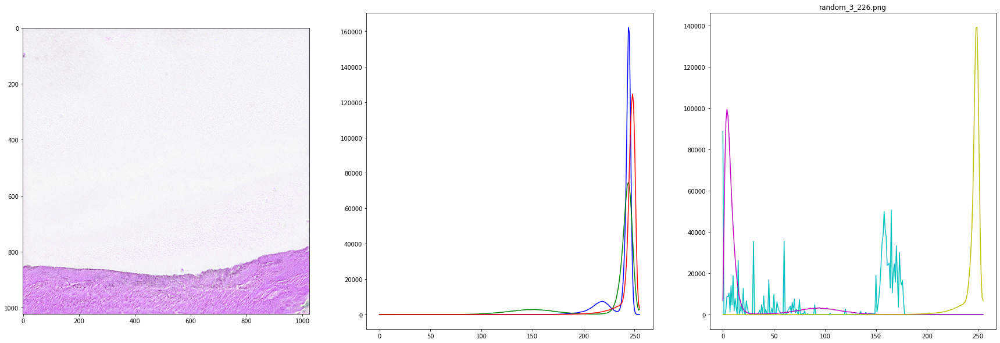

/code/research/images/mcw_he_stylegan_fakes/random_3_226.png
Color b has FWHM: [5]
Color g has FWHM: [10]
Color r has FWHM: [7]
Saturation (magenta) has FWHM: [8]
Value (yellow) has FWHM: [6]



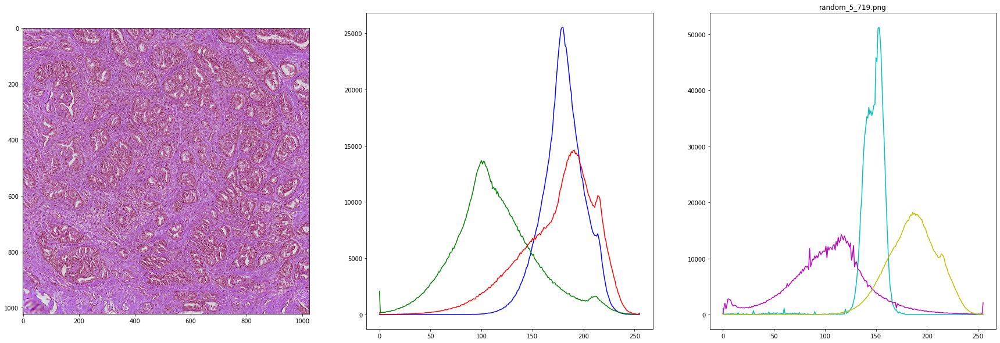

/code/research/images/mcw_he_stylegan_fakes/random_5_719.png
Color b has FWHM: [33]
Color g has FWHM: [64]
Color r has FWHM: [62]
Saturation (magenta) has FWHM: [60]
Value (yellow) has FWHM: [58]



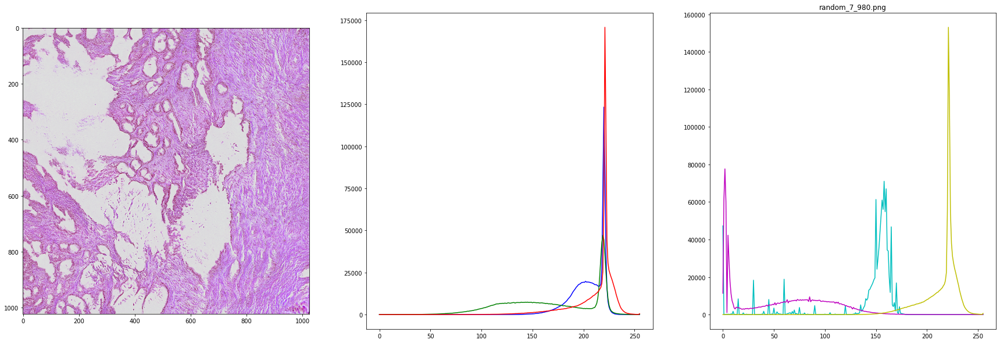

/code/research/images/mcw_he_stylegan_fakes/random_7_980.png
Color b has FWHM: [3]
Color g has FWHM: [7]
Color r has FWHM: [2]
Saturation (magenta) has FWHM: [3 1]
Value (yellow) has FWHM: [2]



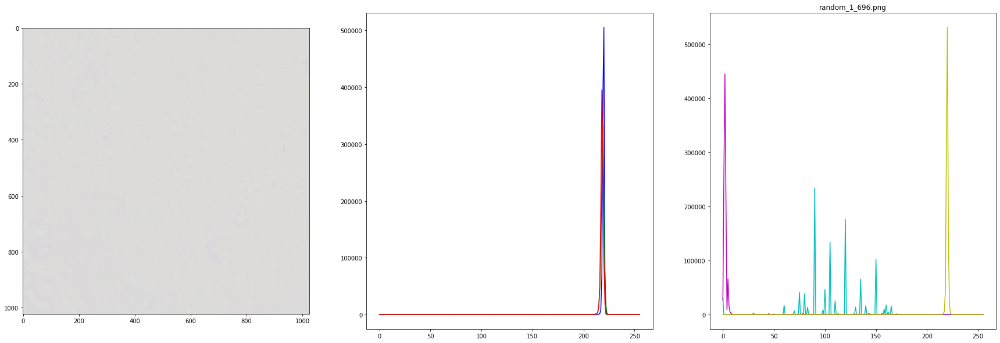

/code/research/images/mcw_he_stylegan_fakes/random_1_696.png
Color b has FWHM: [2]
Color g has FWHM: [3]
Color r has FWHM: [2]
Saturation (magenta) has FWHM: [2]
Value (yellow) has FWHM: [2]



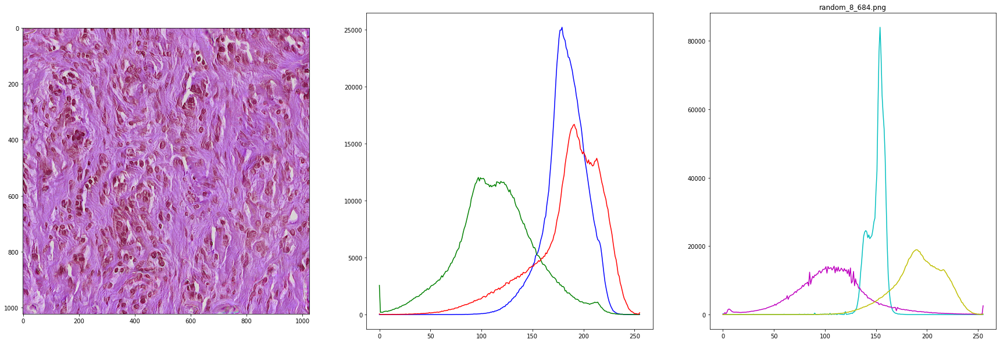

/code/research/images/mcw_he_stylegan_fakes/random_8_684.png
Color b has FWHM: [36]
Color g has FWHM: [72]
Color r has FWHM: [51]
Saturation (magenta) has FWHM: [63]
Value (yellow) has FWHM: [53]



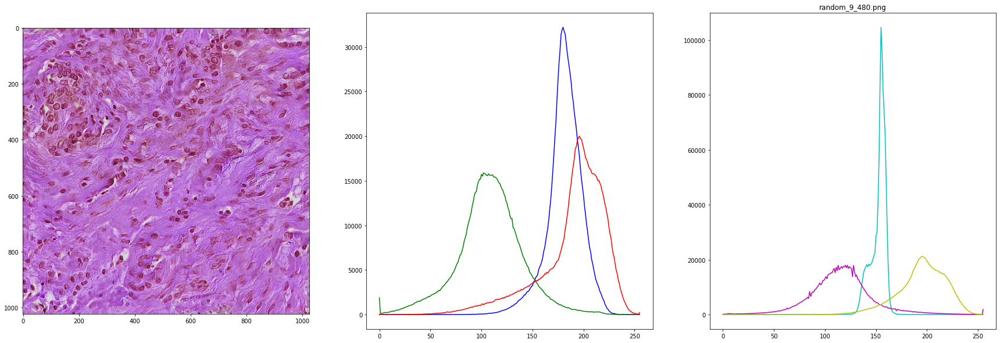

/code/research/images/mcw_he_stylegan_fakes/random_9_480.png
Color b has FWHM: [28]
Color g has FWHM: [54]
Color r has FWHM: [42]
Saturation (magenta) has FWHM: [49]
Value (yellow) has FWHM: [45]



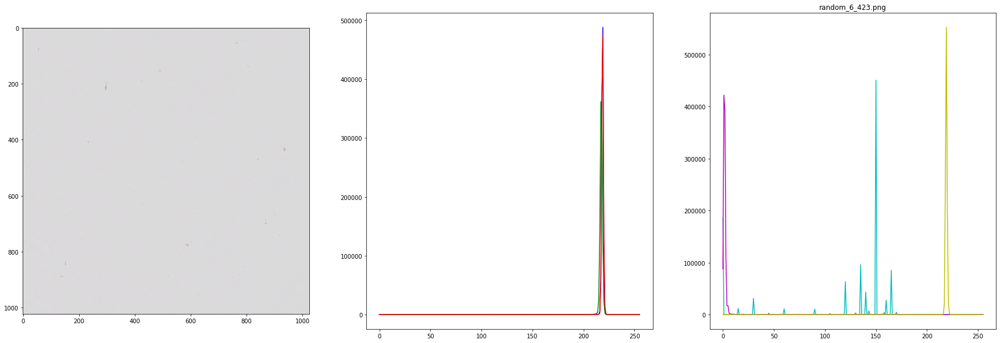

/code/research/images/mcw_he_stylegan_fakes/random_6_423.png
Color b has FWHM: [2]
Color g has FWHM: [2]
Color r has FWHM: [2]
Saturation (magenta) has FWHM: [2]
Value (yellow) has FWHM: [1]



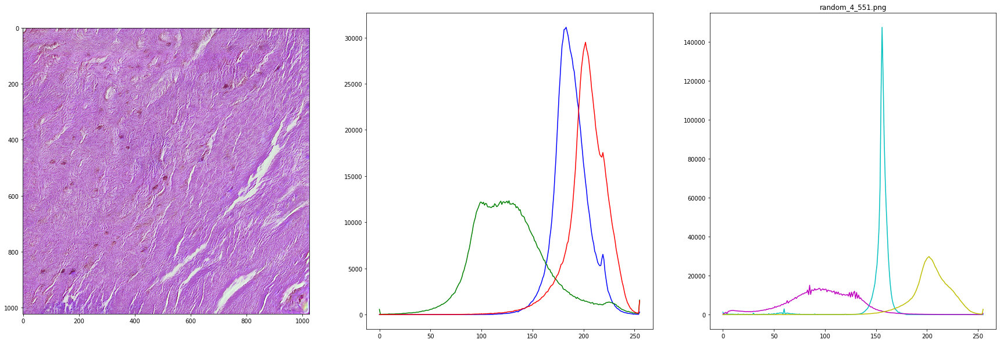

/code/research/images/mcw_he_stylegan_fakes/random_4_551.png
Color b has FWHM: [28]
Color g has FWHM: [74]
Color r has FWHM: [31]
Saturation (magenta) has FWHM: [69]
Value (yellow) has FWHM: [29]



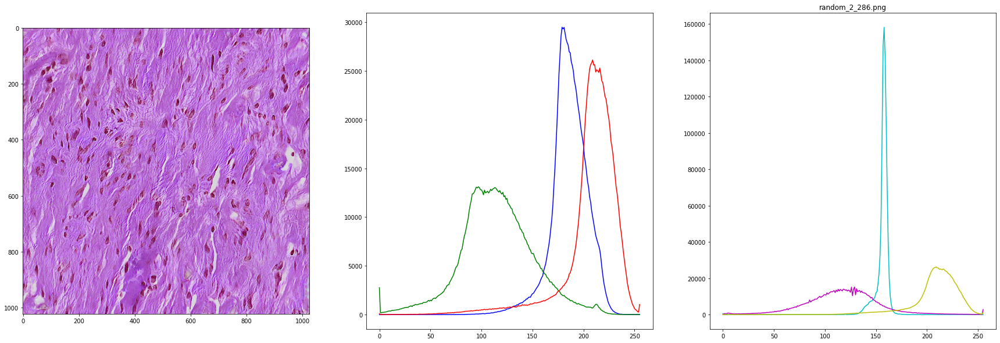

/code/research/images/mcw_he_stylegan_fakes/random_2_286.png
Color b has FWHM: [31]
Color g has FWHM: [69]
Color r has FWHM: [35]
Saturation (magenta) has FWHM: [ 1 62]
Value (yellow) has FWHM: [35]



In [61]:
image_and_histr_array = walk_through_dir_and_print_histograms(input_dir, max_plots=25)

## peso input dataset pngs

1024 x 1024 pngs

In [62]:
input_dir = '/code/research/images/peso_input_images'

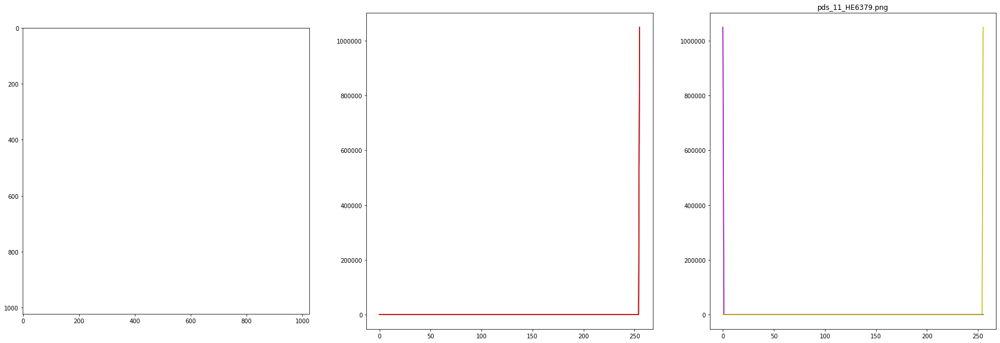

/code/research/images/peso_input_images/pds_11_HE6379.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



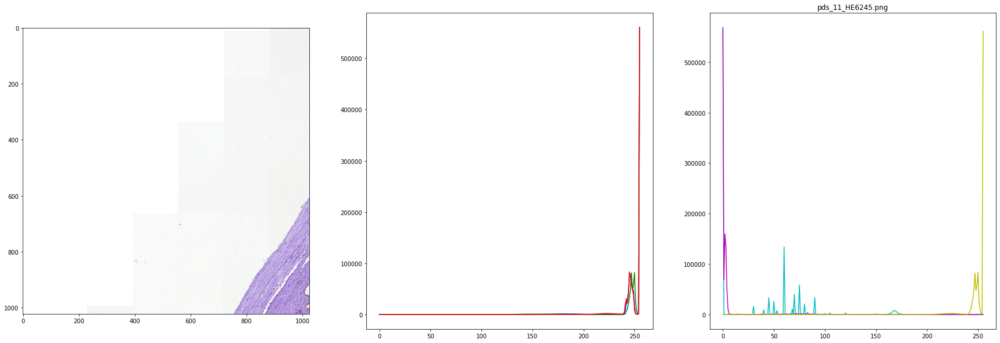

/code/research/images/peso_input_images/pds_11_HE6245.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



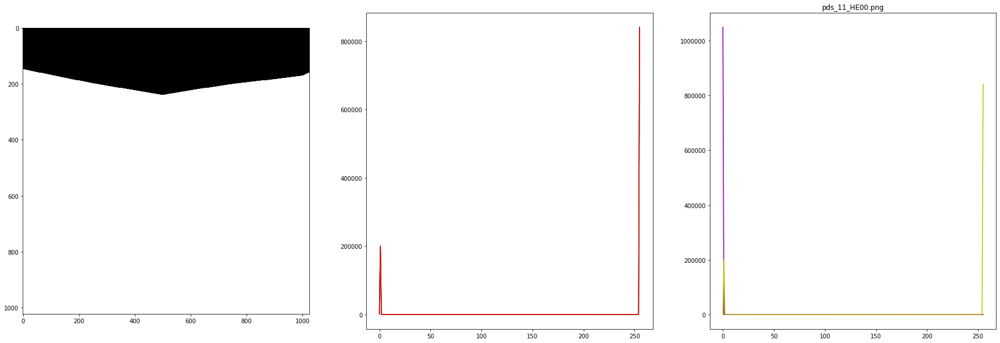

/code/research/images/peso_input_images/pds_11_HE00.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



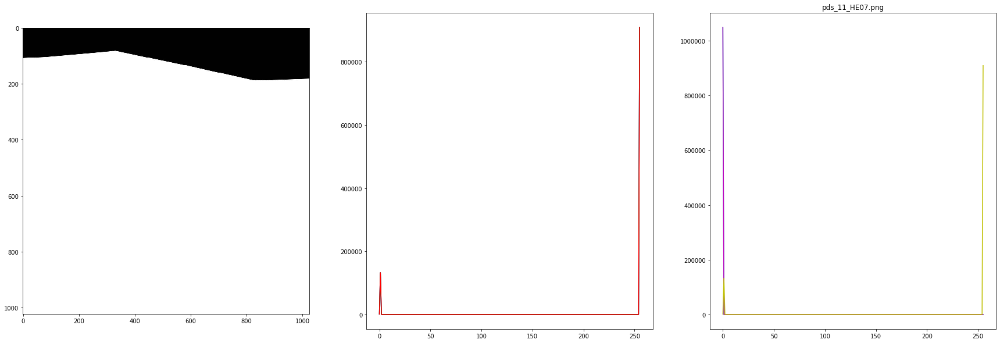

/code/research/images/peso_input_images/pds_11_HE07.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



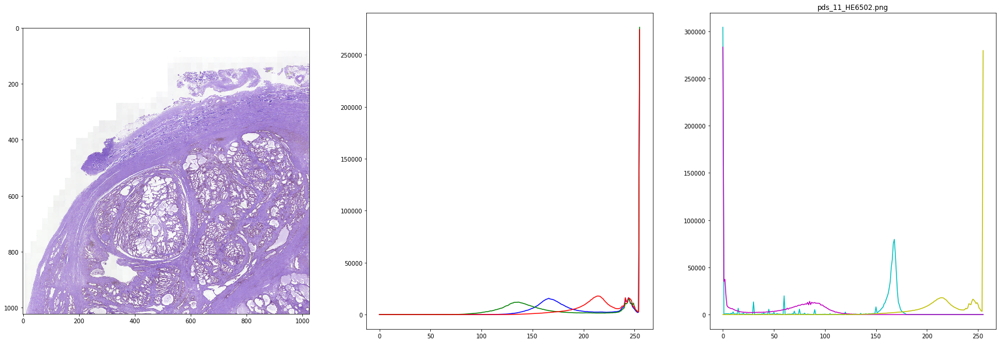

/code/research/images/peso_input_images/pds_11_HE6502.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



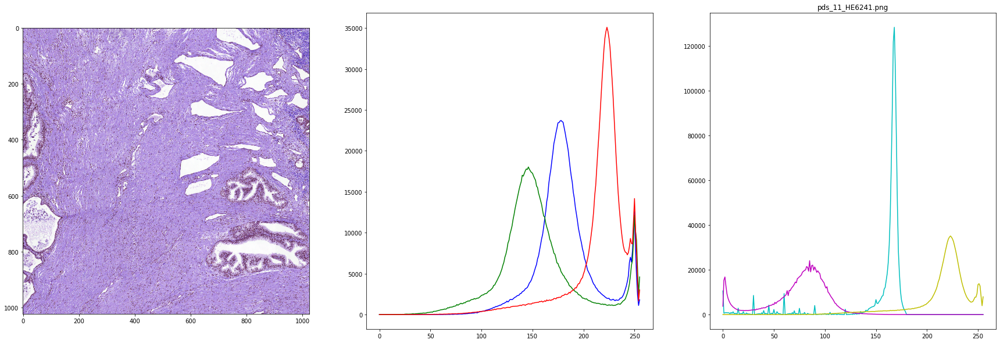

/code/research/images/peso_input_images/pds_11_HE6241.png
Color b has FWHM: [31  1]
Color g has FWHM: [41  3]
Color r has FWHM: [20]
Saturation (magenta) has FWHM: [ 3 33  1]
Value (yellow) has FWHM: [20]



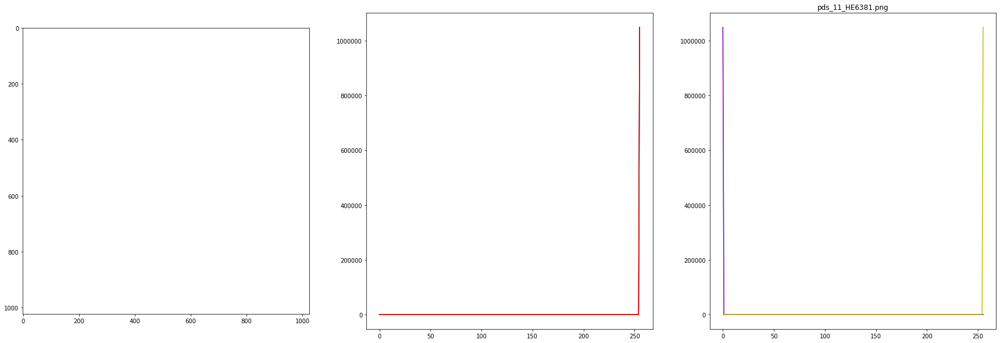

/code/research/images/peso_input_images/pds_11_HE6381.png
Color b has FWHM: []
Color g has FWHM: []
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: []



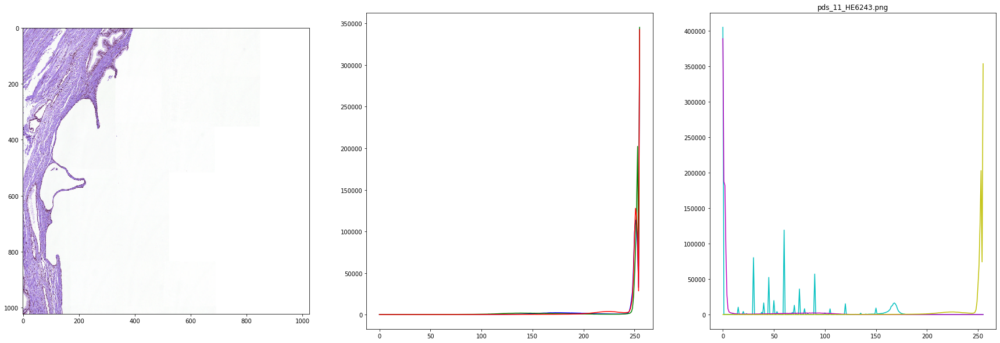

/code/research/images/peso_input_images/pds_11_HE6243.png
Color b has FWHM: []
Color g has FWHM: [ 1 -1]
Color r has FWHM: []
Saturation (magenta) has FWHM: []
Value (yellow) has FWHM: [ 1 -1]



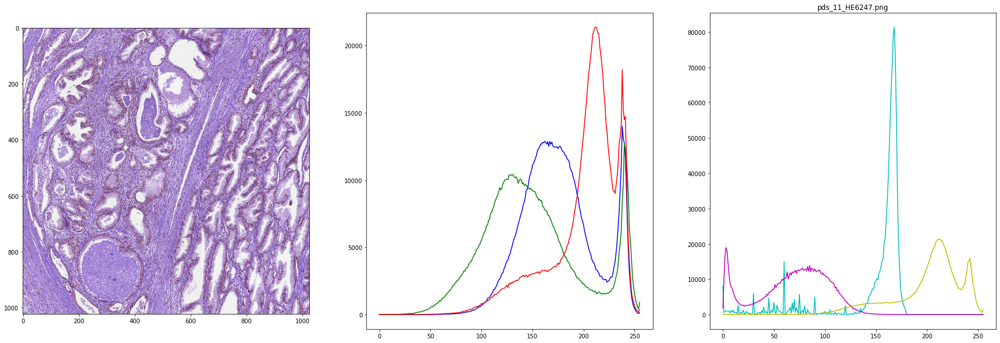

/code/research/images/peso_input_images/pds_11_HE6247.png
Color b has FWHM: [61  8]
Color g has FWHM: [67  7]
Color r has FWHM: [30  9]
Saturation (magenta) has FWHM: [ 6 47]
Value (yellow) has FWHM: [30  6]



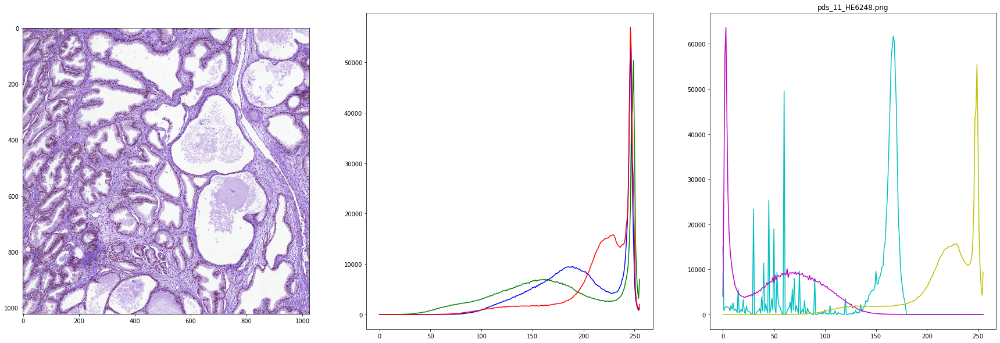

/code/research/images/peso_input_images/pds_11_HE6248.png
Color b has FWHM: [3]
Color g has FWHM: [4]
Color r has FWHM: [4]
Saturation (magenta) has FWHM: [3]
Value (yellow) has FWHM: [4]



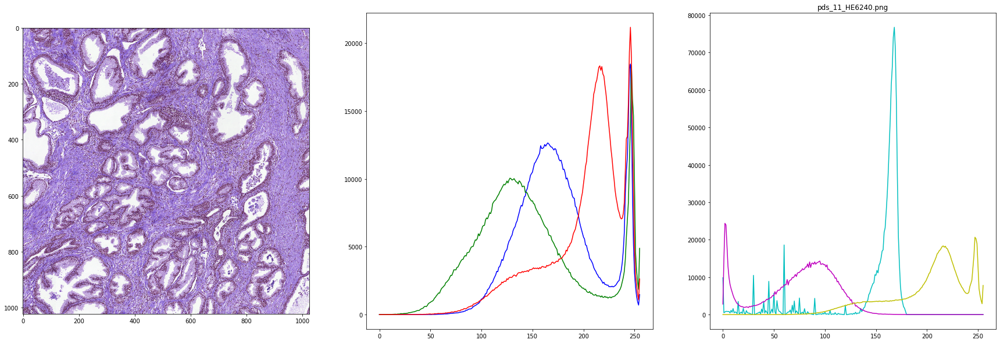

/code/research/images/peso_input_images/pds_11_HE6240.png
Color b has FWHM: [43  6]
Color g has FWHM: [23  6]
Color r has FWHM: [28  8]
Saturation (magenta) has FWHM: [ 5  1 22]
Value (yellow) has FWHM: [28  6]



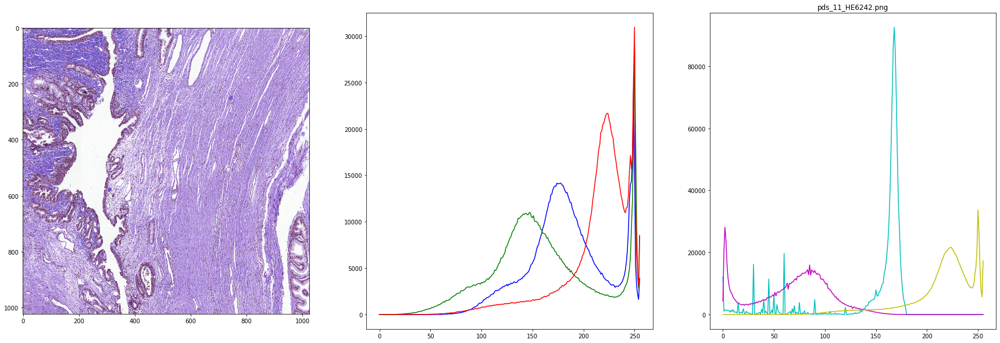

/code/research/images/peso_input_images/pds_11_HE6242.png
Color b has FWHM: [20  6]
Color g has FWHM: [3]
Color r has FWHM: [21  5]
Saturation (magenta) has FWHM: [4 1 1 1 1]


ValueError: operands could not be broadcast together with shapes (2,) (3,) 

In [63]:
peso_pics_and_grams = walk_through_dir_and_print_histograms(input_dir, max_plots=25)